In [1]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans

In [2]:
imgfiles = [
    "plant_dataset/image_001.png",
    "plant_dataset/image_002.png",
    "plant_dataset/image_003.png",
    "plant_dataset/image_004.png",
    "plant_dataset/image_005.png",
    "plant_dataset/image_006.png"
    ]

In [3]:
def process_and_segment_image(file_path):
    print(f"\nProcessing Image: {file_path}")
    
    # load the Image
    try:
        original_image = plt.imread(file_path)
    except FileNotFoundError:
        print(f"Error: File {file_path} not found. Please upload it or check the name.")
        return

    # check image color data type
    if original_image.dtype == np.uint8:
        max_color_value = 255
    else:
        max_color_value = 1.0

    image_height, image_width, color_channels = original_image.shape
    
    # for k means we need it to be a 2d array (matrix)
    pixel_data_matrix = original_image.reshape(-1, 3)
    
    # normal ahh k means again
    k_values_to_test = [2, 3, 4, 5]
    
    for k in k_values_to_test:
        print(f"\n--- segmentation with K = {k} ---")
        
        kmeans_algorithm = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans_algorithm.fit(pixel_data_matrix)
        
        # get the cluster ID (0 to k-1) for every single pixel
        pixel_cluster_ids = kmeans_algorithm.labels_
       
        # show the img
        plt.figure(figsize=(15, 5))
        plt.suptitle(f"K = {k} clusters", fontsize=16)
        
        for cluster_id in range(k):
            # blank white image
            segmented_image_flat = np.full_like(pixel_data_matrix, max_color_value)
            
            # masking pixels which don't belong to this clutter
            indices_in_current_cluster = (pixel_cluster_ids == cluster_id)
            
            # get colors from image, but only in the mask (photoshop type stuff)
            segmented_image_flat[indices_in_current_cluster] = pixel_data_matrix[indices_in_current_cluster]
            
            # get back normal image format (Height x Width x 3)
            final_segmented_image = segmented_image_flat.reshape(image_height, image_width, color_channels)
            
            # show the img
            plt.subplot(1, k, cluster_id + 1)
            plt.imshow(final_segmented_image)
            plt.title(f"Cluster {cluster_id}")
            plt.axis('off') # Hide axis numbers
            
        plt.show()


Processing Image: plant_dataset/image_001.png

--- segmentation with K = 2 ---


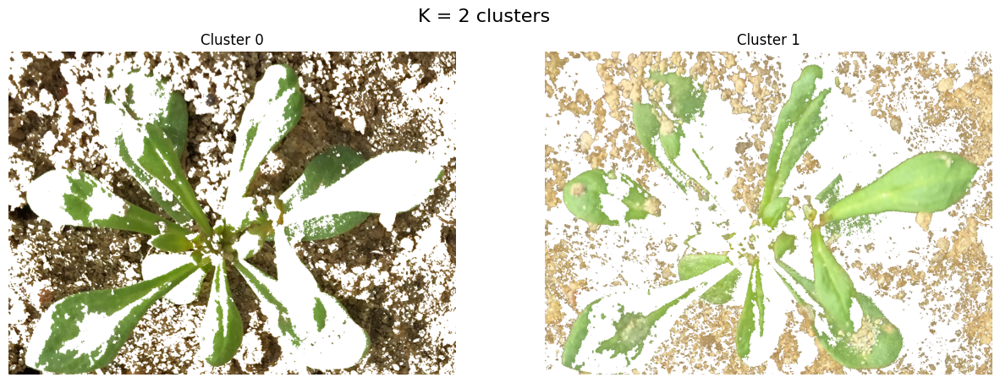


--- segmentation with K = 3 ---


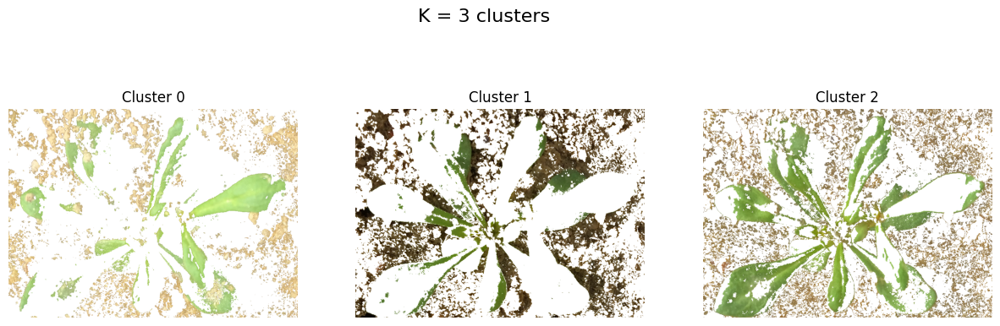


--- segmentation with K = 4 ---


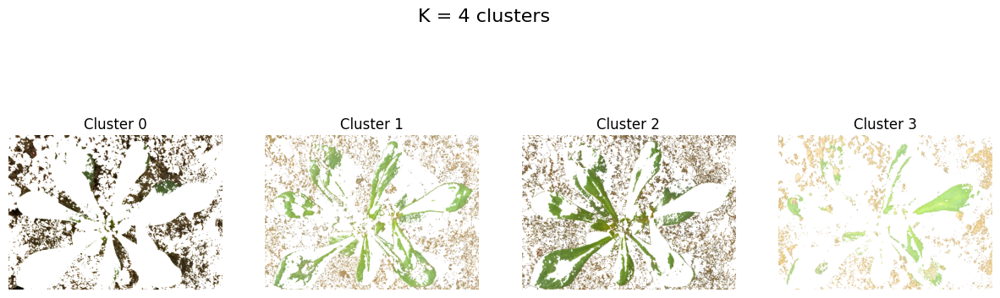


--- segmentation with K = 5 ---


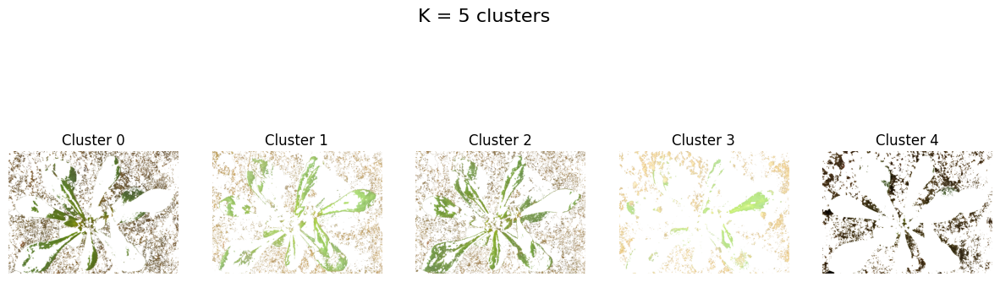


Processing Image: plant_dataset/image_002.png

--- segmentation with K = 2 ---


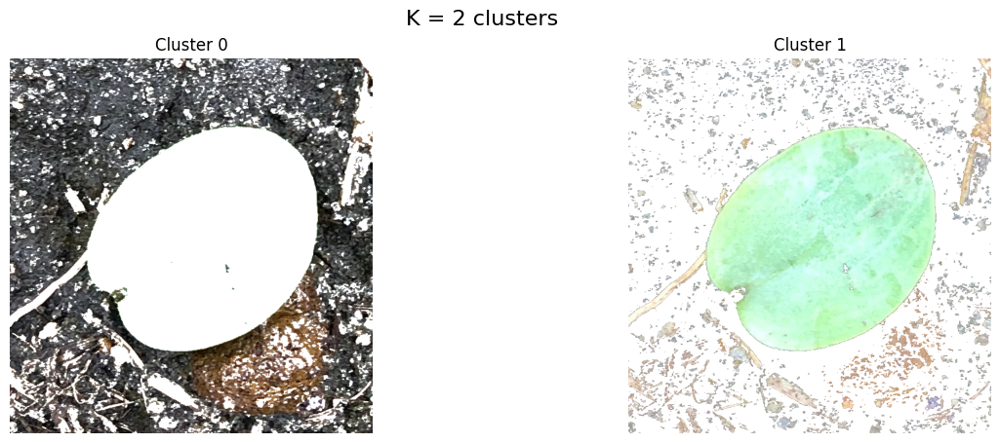


--- segmentation with K = 3 ---


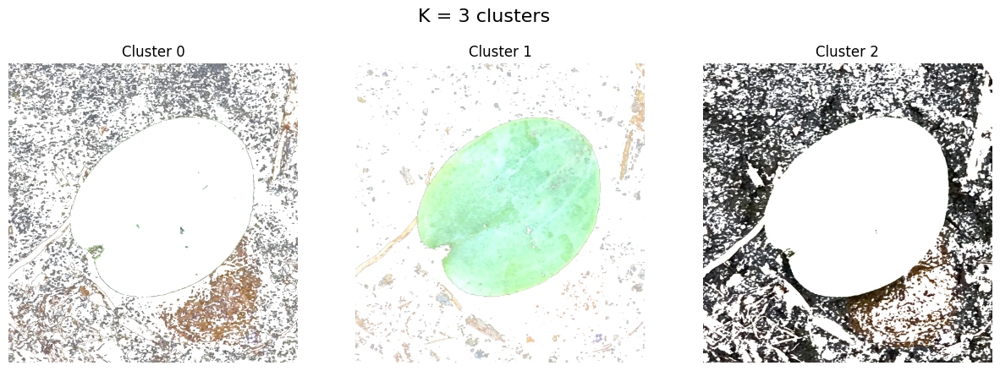


--- segmentation with K = 4 ---


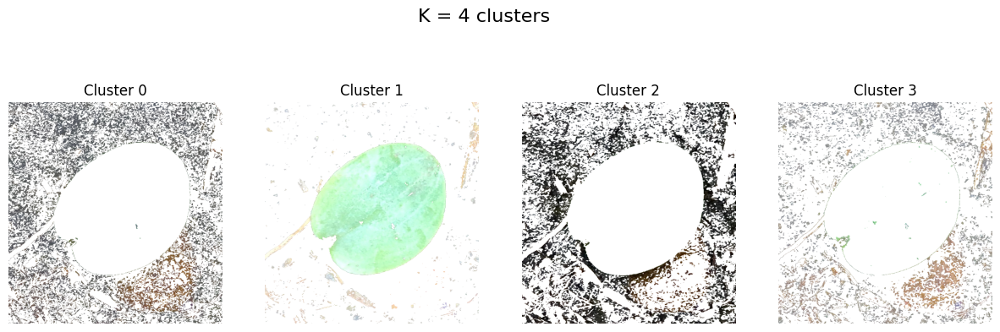


--- segmentation with K = 5 ---


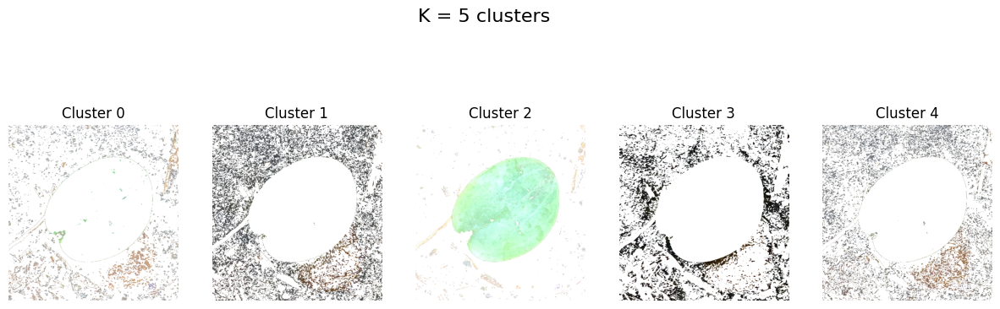


Processing Image: plant_dataset/image_003.png

--- segmentation with K = 2 ---


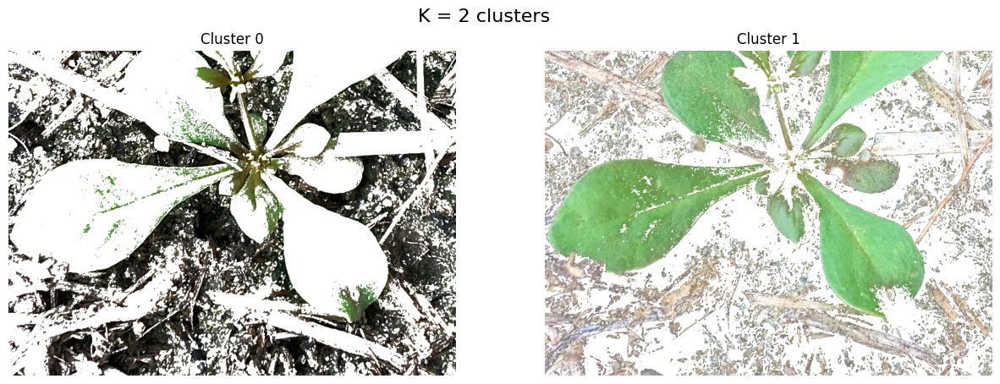


--- segmentation with K = 3 ---


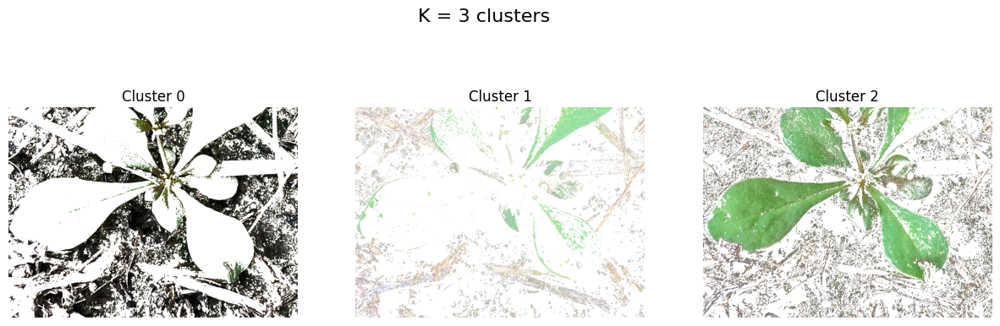


--- segmentation with K = 4 ---


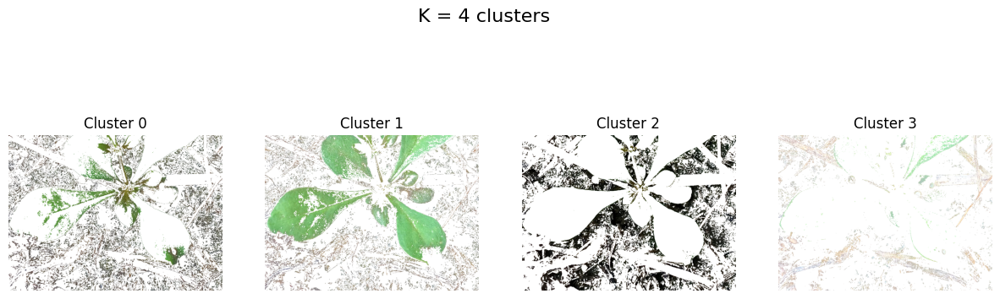


--- segmentation with K = 5 ---


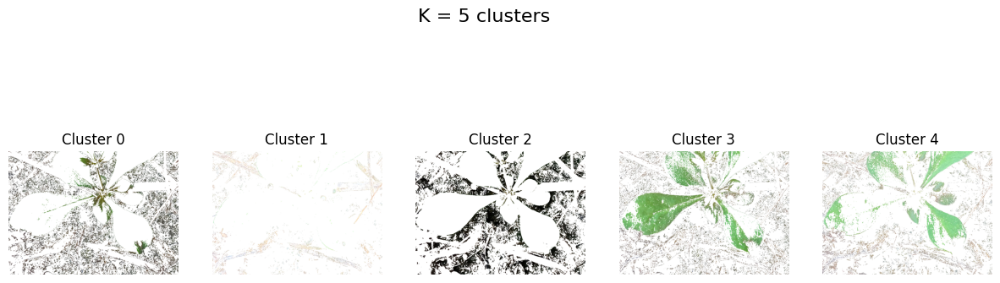


Processing Image: plant_dataset/image_004.png
Error: File plant_dataset/image_004.png not found. Please upload it or check the name.

Processing Image: plant_dataset/image_005.png

--- segmentation with K = 2 ---


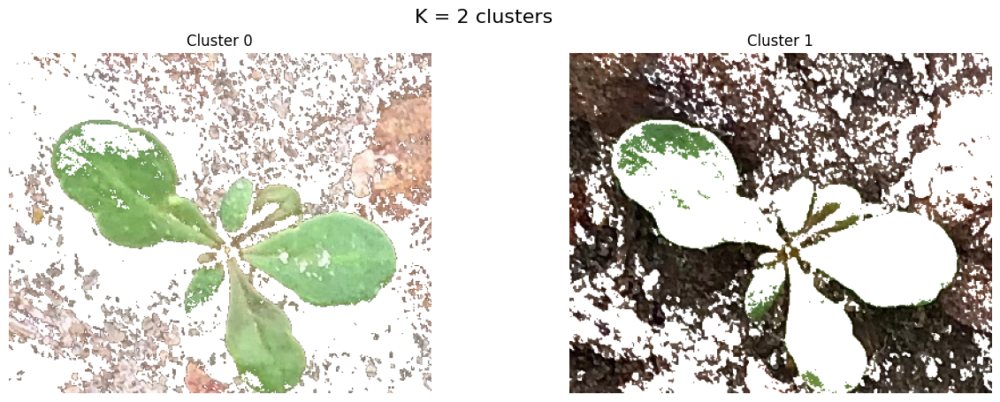


--- segmentation with K = 3 ---


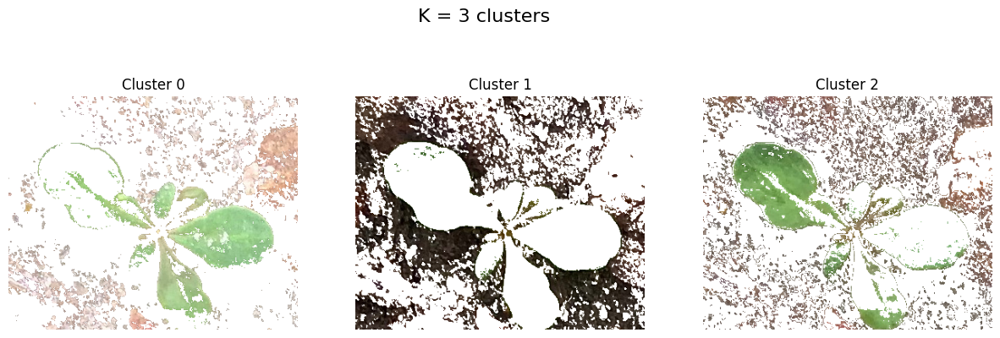


--- segmentation with K = 4 ---


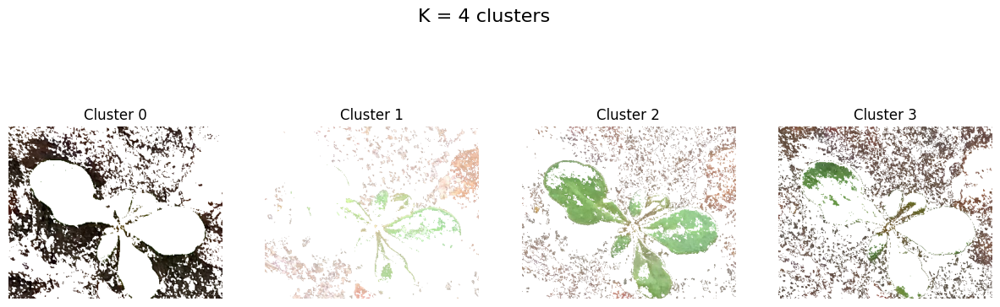


--- segmentation with K = 5 ---


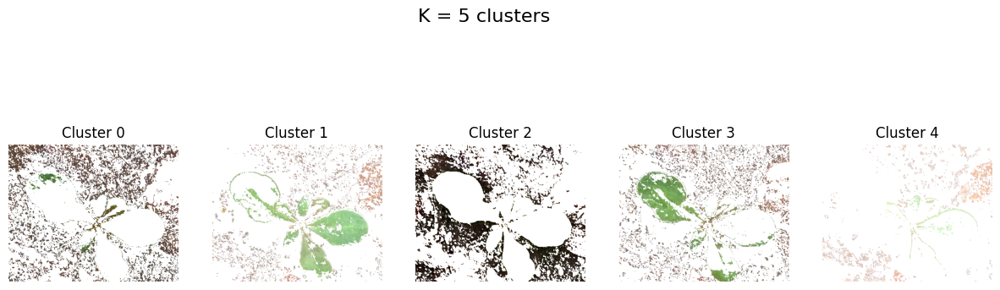


Processing Image: plant_dataset/image_006.png

--- segmentation with K = 2 ---


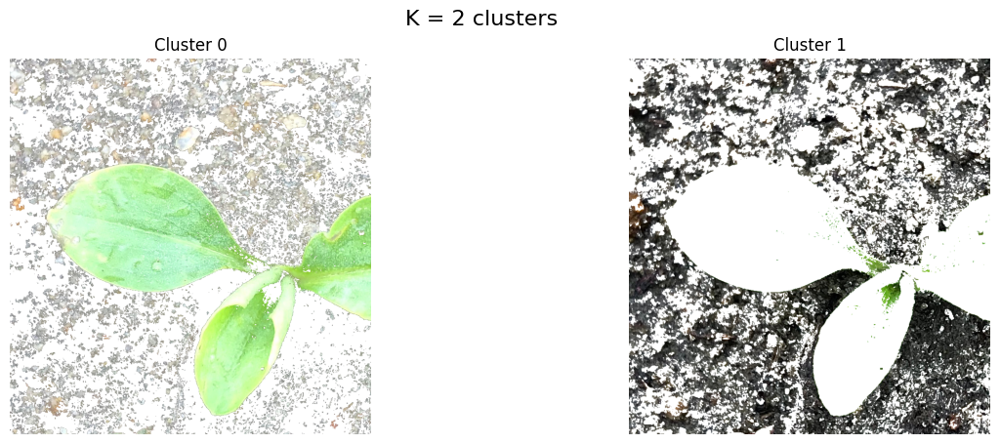


--- segmentation with K = 3 ---


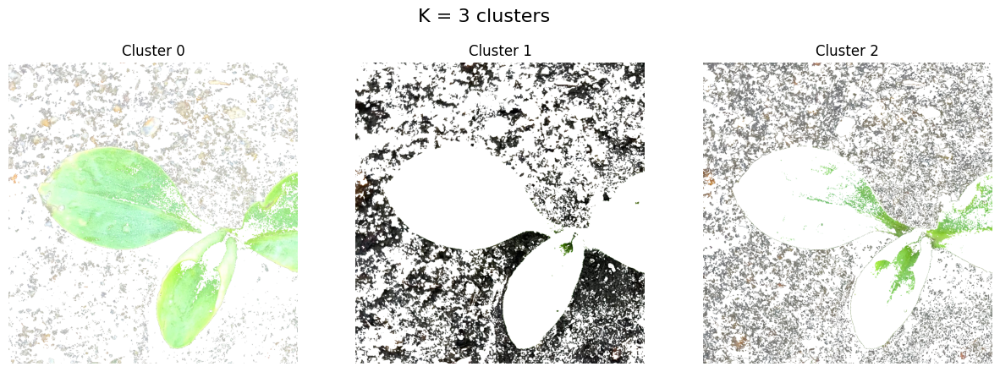


--- segmentation with K = 4 ---


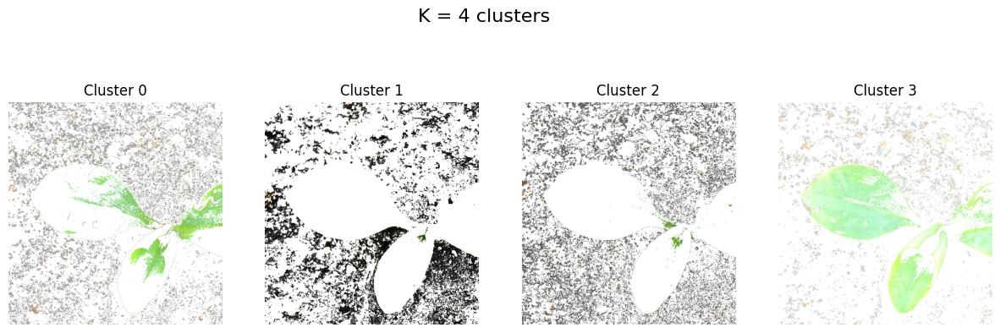


--- segmentation with K = 5 ---


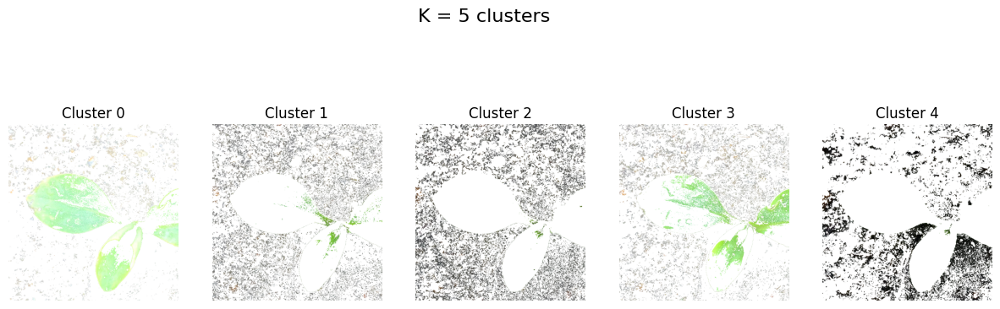

In [4]:
for imgfile in imgfiles:
    process_and_segment_image(imgfile)